### Weighted model activations

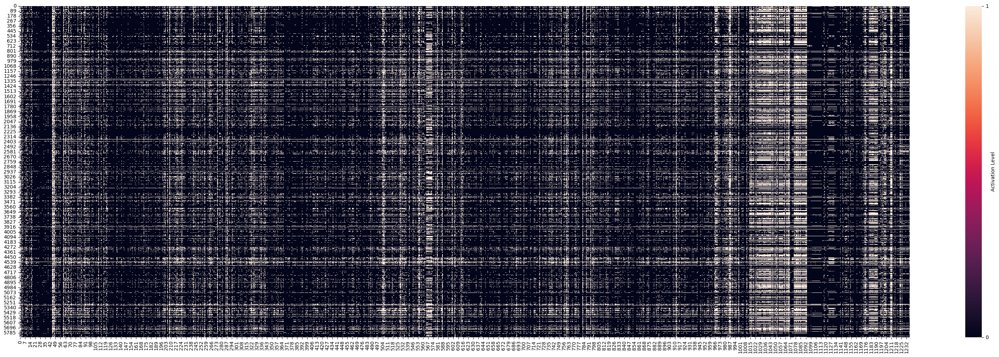

In [57]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import torch
# Define the activation levels, molecule names, and receptor names
num_molecules = 32
num_receptors = 10
activation_levels = np.random.rand(num_molecules, num_receptors)

logits_path = 'data/datasets/full_weighted_1237_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
OR_preds = torch.round(torch.sigmoid(OR_logits))


fig, ax1 = plt.subplots(figsize=(40, 12))

sns.heatmap(OR_preds, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, ax=ax1)

#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
plt.show()


### Naive model activations

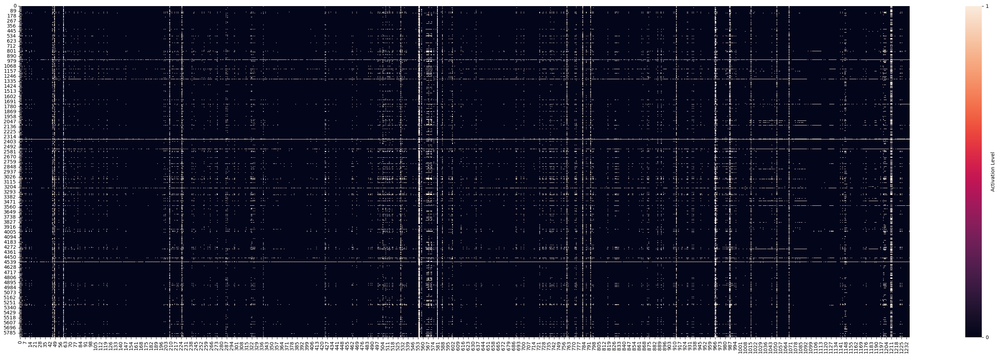

In [61]:
logits_path = 'data/datasets/full_1237_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
OR_preds = torch.round(torch.sigmoid(OR_logits))


fig, ax1 = plt.subplots(figsize=(40, 12))

sns.heatmap(OR_preds, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, ax=ax1)

#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
plt.show()


### Data prep for GS-LF

In [63]:
import pandas as pd
gs_lf = pd.read_csv('data/datasets/NaNs_GS_LF_isomeric_SMILES_dedup_odor_filtered.csv')

fruity_idx = gs_lf[gs_lf['fruity'] == 1].index
vanilla_idx = gs_lf[gs_lf['vanilla'] == 1].index
creamy_idx = gs_lf[gs_lf['creamy'] == 1].index
sweet_idx = gs_lf[gs_lf['sweet'] == 1].index
fishy_idx = gs_lf[gs_lf['fishy'] == 1].index
pungent_idx = gs_lf[gs_lf['pungent'] == 1].index
sulfurous_idx = gs_lf[gs_lf['sulfurous'] == 1].index
vanilla_creamy_idx = vanilla_idx.intersection(creamy_idx)
fishy_sulforous_idx = fishy_idx.intersection(sulfurous_idx)
vanilla_creamy_idx


Index([ 175,  286,  300,  510,  533,  540,  552,  553,  554,  577,  622,  724,
        847, 1266, 1363, 1380, 2010, 2096, 2291, 2397, 2411, 2538, 2539, 3123,
       3215, 3504, 3539, 3540, 3716, 4203, 4266, 4287, 4966, 5501],
      dtype='int64')

### Plots by percept hierarchies

In [ ]:
## vanilla_creamy_idx 
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import torch
# Define the activation levels, molecule names, and receptor names
num_molecules = len(vanilla_creamy_idx)
num_receptors = 10
#activation_levels = np.random.rand(num_molecules, num_receptors)

# ... (rest of your code)
OR_logits = torch.load('data/datasets/full_1237_ORs_logits.pt').cpu()
OR_logits = OR_logits[vanilla_creamy_idx]
OR_preds = torch.sigmoid(OR_logits)

#activation_levels[:15, :5] += np.random.normal(0.1, 0.1, (15, 5))
#activation_levels[15:, 5:] += np.random.normal(0.1, 0.1, (17, 5))
#activation_levels += np.random.normal(0, 0.1, activation_levels.shape)
#activation_levels = np.clip(activation_levels, 0, 1)

# Define pleasant and unpleasant molecules
#molecules = names
real_receptors = [i for i in range(400)]

# Define color palettes
pleasant_cmap = sns.color_palette(["#ffffff", "#3498db"])  # White to blue
unpleasant_cmap = sns.color_palette("Reds", as_cmap=True)

#pleasant_cmap = sns.color_palette([(0.2, 0.2, 1), (1, 0.2, 0.2)])
#unpleasant_cmap = sns.color_palette([(0.8, 0.8, 1), (1, 0.8, 0.8)])

# Plotting the heatmap
fig, ax1 = plt.subplots(figsize=(40, 12))

sns.heatmap(OR_preds, cmap=pleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, ax=ax1)

ax1.set_ylabel("Vanilla/creamy percept Molecules")
plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
plt.show()


In [ ]:
citrus = gs_lf[gs_lf['citrus'] == 1].index
waxy = gs_lf[gs_lf['waxy'] == 1].index
fatty = gs_lf[gs_lf['fatty'] == 1].index

odor_fam_citrus= citrus.intersection(waxy)
odor_fam_citrus = odor_fam_citrus.intersection(fatty)
odor_fam_citrus

# ... (rest of your code)
OR_logits = torch.load('data/datasets/full_1237_ORs_logits.pt').cpu()
OR_logits = OR_logits[odor_fam_citrus]
OR_preds = torch.sigmoid(OR_logits)

#activation_levels[:15, :5] += np.random.normal(0.1, 0.1, (15, 5))
#activation_levels[15:, 5:] += np.random.normal(0.1, 0.1, (17, 5))
#activation_levels += np.random.normal(0, 0.1, activation_levels.shape)
#activation_levels = np.clip(activation_levels, 0, 1)

# Define pleasant and unpleasant molecules
#molecules = names
real_receptors = [i for i in range(400)]

# Define color palettes
pleasant_cmap = sns.color_palette(["#ffffff", "#3498db"])  # White to blue
unpleasant_cmap = sns.color_palette("Reds", as_cmap=True)

#pleasant_cmap = sns.color_palette([(0.2, 0.2, 1), (1, 0.2, 0.2)])
#unpleasant_cmap = sns.color_palette([(0.8, 0.8, 1), (1, 0.8, 0.8)])

# Plotting the heatmap
fig, ax1 = plt.subplots(figsize=(40, 12))

sns.heatmap(OR_preds, cmap=pleasant_cmap, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, ax=ax1)

ax1.set_ylabel("Citrus, waxy and fatty percept Molecules")
plt.title('Citrus, waxy and fatty molecules by predicted OR activation', fontdict={'fontsize': 24})
plt.show()




In [ ]:
OR_logits = torch.load('data/datasets/full_1237_ORs_logits.pt').cpu()
OR_preds = torch.sigmoid(OR_logits)

## Filter out columns with >30% rows being 1 in OR_preds
threshold = 0.3
mask = OR_preds.mean(dim=0) < threshold
OR_preds = OR_preds[:, mask]


fig, ax1 = plt.subplots(figsize=(40, 12))

sns.heatmap(OR_preds, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, ax=ax1)

#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
plt.show()


In [ ]:
logits_path = 'data/datasets/full_1237_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
OR_preds = torch.round(torch.sigmoid(OR_logits))

## Filter out columns with >30% rows being 1 in OR_preds
threshold = 0.3
mask = OR_preds.mean(dim=0) < threshold
OR_preds = OR_preds[:, mask]
OR_preds_citrus = OR_preds[odor_fam_citrus]


fig, ax1 = plt.subplots(figsize=(40, 12))

sns.heatmap(OR_preds_citrus, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, ax=ax1)

#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
plt.title("Citrus, waxy and fatty molecules by predicted naive MolOR OR activation")
plt.show()


In [ ]:
logits_path = 'data/datasets/full_1237_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
OR_preds = torch.sigmoid(OR_logits)
OR_activations = torch.round(OR_preds)

## Filter out columns with >30% rows being 1 in OR_preds
threshold = 0.3
mask = OR_activations.mean(dim=0) < threshold
OR_preds = OR_preds[:, mask]
OR_activations = OR_activations[:, mask]

OR_preds_citrus = OR_preds[odor_fam_citrus]
OR_activations_citrus = OR_activations[odor_fam_citrus]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40,12), sharex=True, sharey=True)

im = sns.heatmap(OR_preds_citrus, fmt='d', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax1)
ax1.set_title("Citrus, waxy and fatty molecules by predicted MolOR OR activation probabilities")
#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
sns.heatmap(OR_activations_citrus, fmt='.2f', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax2)
ax2.set_title("Citrus, waxy and fatty molecules by predicted naive MolOR OR activation")

mappable = im.get_children()[0]
plt.colorbar(mappable, ax = [ax1,ax2],orientation = 'horizontal', aspect=30)

plt.show()



In [ ]:
logits_path = 'data/datasets/full_1237_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
OR_preds = torch.sigmoid(OR_logits)
OR_activations = torch.round(OR_preds)

## Filter out columns with >30% rows being 1 in OR_preds
threshold = 0.3
mask = OR_activations.mean(dim=0) < threshold
OR_preds = OR_preds[:, mask]
OR_activations = OR_activations[:, mask]

vanilla = gs_lf[gs_lf['vanilla'] == 1].index
creamy = gs_lf[gs_lf['creamy'] == 1].index
sweet = gs_lf[gs_lf['sweet'] == 1].index
vanilla_creamy = vanilla.intersection(creamy)
vanilla_creamy_sweet_idx = vanilla_creamy.intersection(sweet)
OR_preds_vanilla = OR_preds[vanilla_creamy_sweet_idx]

OR_activations_vanilla = OR_activations[vanilla_creamy_sweet_idx]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40,12), sharex=True, sharey=True)

im = sns.heatmap(OR_preds_vanilla, fmt='d', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax1)
ax1.set_title("vanilla, creamy and sweet molecules by predicted MolOR OR activation probabilities")
#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
sns.heatmap(OR_activations_vanilla, fmt='.2f', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax2)
ax2.set_title("vanilla, creamy, and sweet molecules by predicted naive MolOR OR activation")

mappable = im.get_children()[0]
plt.colorbar(mappable, ax = [ax1,ax2],orientation = 'horizontal', aspect=30)

plt.show()


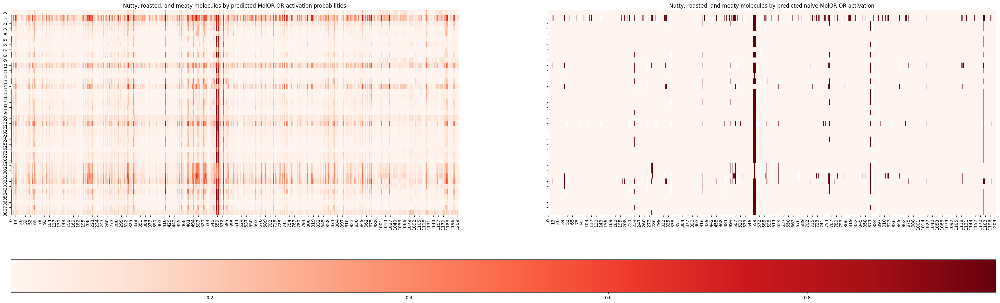

In [64]:
logits_path = 'data/datasets/full_1237_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
OR_preds = torch.sigmoid(OR_logits)
OR_activations = torch.round(OR_preds)

## Filter out columns with >30% rows being 1 in OR_preds
threshold = 0.3
mask = OR_activations.mean(dim=0) < threshold
OR_preds = OR_preds[:, mask]
OR_activations = OR_activations[:, mask]

nutty = gs_lf[gs_lf['nutty'] == 1].index
roasted = gs_lf[gs_lf['roasted'] == 1].index
meaty = gs_lf[gs_lf['meaty'] == 1].index
nutty_roasted = nutty.intersection(roasted)
nutty_roasted_meaty_idx = nutty_roasted.intersection(meaty)
OR_preds_nutty = OR_preds[nutty_roasted_meaty_idx]

OR_activations_nutty = OR_activations[nutty_roasted_meaty_idx]


cmap = sns.color_palette("Reds", as_cmap=True)


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40,12), sharex=True, sharey=True)

im = sns.heatmap(OR_preds_nutty, cmap = cmap, fmt='d', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax1)
ax1.set_title("Nutty, roasted, and meaty molecules by predicted MolOR OR activation probabilities")
#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
sns.heatmap(OR_activations_nutty, cmap = cmap, fmt='.2f', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax2)
ax2.set_title("Nutty, roasted, and meaty molecules by predicted naive MolOR OR activation")

mappable = im.get_children()[0]
plt.colorbar(mappable, ax = [ax1,ax2],orientation = 'horizontal', aspect=30)

plt.show()

In [ ]:
logits_path = 'data/datasets/full_1237_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
OR_preds = torch.sigmoid(OR_logits)
OR_activations = torch.round(OR_preds)

## Filter out columns with >30% rows being 1 in OR_preds
threshold = 0.3
mask = OR_activations.mean(dim=0) < threshold
OR_preds = OR_preds[:, mask]
OR_activations = OR_activations[:, mask]

fruity = gs_lf[gs_lf['fruity'] == 1].index
minty = gs_lf[gs_lf['minty'] == 1].index
floral = gs_lf[gs_lf['floral'] == 1].index
fruity_minty = fruity.intersection(minty)
fruity_minty_floral = fruity_minty.intersection(floral)
OR_preds_nutty = OR_preds[fruity_minty_floral]

OR_activations_nutty = OR_activations[fruity_minty_floral]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40,12), sharex=True, sharey=True)

im = sns.heatmap(OR_preds_nutty, fmt='d', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax1)
ax1.set_title("fruity_minty_floral molecules by predicted MolOR OR activation probabilities")
#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
sns.heatmap(OR_activations_nutty, fmt='.2f', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax2)
ax2.set_title("fruity_minty_floral molecules by predicted naive MolOR OR activation")

mappable = im.get_children()[0]
plt.colorbar(mappable, ax = [ax1,ax2],orientation = 'horizontal', aspect=30)

plt.show()

In [ ]:
fishy_idx

In [ ]:
fishy_idx = gs_lf[gs_lf['fishy'] == 1].index
meaty = gs_lf[gs_lf['meaty'] == 1].index

fishy_meaty = fishy_idx.intersection(meaty)

logits_path = 'data/datasets/full_1237_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
OR_preds = torch.sigmoid(OR_logits)
OR_activations = torch.round(OR_preds)

## Filter out columns with >30% rows being 1 in OR_preds
threshold = 0.3
mask = OR_activations.mean(dim=0) < threshold
OR_preds = OR_preds[:, mask]
OR_activations = OR_activations[:, mask]

OR_preds_fishy = OR_preds[fishy_idx]

OR_activations_fishy = OR_activations[fishy_idx]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40,12), sharex=True, sharey=True)

im = sns.heatmap(OR_preds_fishy, fmt='d', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax1)
ax1.set_title("Fishy molecules by predicted MolOR OR activation probabilities")
#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
sns.heatmap(OR_activations_fishy, fmt='.2f', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax2)
ax2.set_title("Fishy molecules by predicted naive MolOR OR activation")

mappable = im.get_children()[0]
plt.colorbar(mappable, ax = [ax1,ax2],orientation = 'horizontal', aspect=30)

plt.show()


In [ ]:
OR_preds_fishy = OR_preds[fishy_meaty]

OR_activations_fishy = OR_activations[fishy_meaty]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40,12), sharex=True, sharey=True)

im = sns.heatmap(OR_preds_fishy, fmt='d', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax1)
ax1.set_title("Fishy, meaty molecules by predicted MolOR OR activation probabilities")
#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
sns.heatmap(OR_activations_fishy, fmt='.2f', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax2)
ax2.set_title("Fishy, meaty molecules by predicted naive MolOR OR activation")

mappable = im.get_children()[0]
plt.colorbar(mappable, ax = [ax1,ax2],orientation = 'horizontal', aspect=30)

plt.show()


In [ ]:
sulfurous_idx = gs_lf[gs_lf['sulfurous'] == 1].index


logits_path = 'data/datasets/full_1237_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
OR_preds = torch.sigmoid(OR_logits)
OR_activations = torch.round(OR_preds)

## Filter out columns with >30% rows being 1 in OR_preds
threshold = 0.3
mask = OR_activations.mean(dim=0) < threshold
OR_preds = OR_preds[:, mask]
OR_activations = OR_activations[:, mask]

OR_preds_fishy = OR_preds[sulfurous_idx]

OR_activations_fishy = OR_activations[sulfurous_idx]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40,12), sharex=True, sharey=True)

im = sns.heatmap(OR_preds_fishy, fmt='d', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax1)
ax1.set_title("Sulfurous molecules by predicted MolOR OR activation probabilities")
#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
sns.heatmap(OR_activations_fishy, fmt='.2f', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax2)
ax2.set_title("Sulfurous molecules by predicted naive MolOR OR activation")

mappable = im.get_children()[0]
plt.colorbar(mappable, ax = [ax1,ax2],orientation = 'horizontal', aspect=30)

plt.show()

In [ ]:
sharp_idx = gs_lf[gs_lf['sharp'] == 1].index
sulfurous_sharp = sharp_idx.intersection(sulfurous_idx)

logits_path = 'data/datasets/full_1237_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
OR_preds = torch.sigmoid(OR_logits)
OR_activations = torch.round(OR_preds)

## Filter out columns with >30% rows being 1 in OR_preds
threshold = 0.3
mask = OR_activations.mean(dim=0) < threshold
OR_preds = OR_preds[:, mask]
OR_activations = OR_activations[:, mask]

OR_preds_fishy = OR_preds[sulfurous_sharp]

OR_activations_fishy = OR_activations[sulfurous_sharp]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40,12), sharex=True, sharey=True)

im = sns.heatmap(OR_preds_fishy, fmt='d', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax1)
ax1.set_title("Sulfurous, sharp molecules by predicted MolOR OR activation probabilities")
#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
sns.heatmap(OR_activations_fishy, fmt='.2f', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax2)
ax2.set_title("Sulfurous, sharp molecules by predicted naive MolOR OR activation")

mappable = im.get_children()[0]
plt.colorbar(mappable, ax = [ax1,ax2],orientation = 'horizontal', aspect=30)

plt.show()

In [ ]:
weighted_logits_path = 'data/datasets/full_weighted_1237_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
weighted_OR_logits = torch.load(weighted_logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
#weighted_OR_preds = torch.sigmoid(weighted_OR_logits)
weighted_OR_preds = torch.round(torch.sigmoid(weighted_OR_logits))

## Filter out columns with >30% rows being 1 in OR_preds
threshold = 0.3
mask = weighted_OR_preds.mean(dim=0) < threshold
weighted_OR_preds = weighted_OR_preds[:, mask]
weighted_OR_preds_citrus = weighted_OR_preds[odor_fam_citrus]


fig, ax1 = plt.subplots(figsize=(40, 12))

sns.heatmap(weighted_OR_preds_citrus, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, ax=ax1)

#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
plt.title("Citrus, waxy and fatty molecules by predicted weighted OR activation")
plt.show()


In [ ]:
weighted_logits_path = 'data/datasets/full_weighted_1237_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
weighted_OR_logits = torch.load(weighted_logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
weighted_OR_preds = torch.round(torch.sigmoid(OR_logits))

## Filter out columns with >30% rows being 1 in OR_preds
threshold = 0.3
mask = weighted_OR_preds.mean(dim=0) < threshold
weighted_OR_preds = weighted_OR_preds[:, mask]

floral = gs_lf[gs_lf['floral'] == 1].index
#woody = gs_lf[gs_lf['woody'] == 1].index
minty = gs_lf[gs_lf['minty'] == 1].index
floral_minty_idx = floral.intersection(minty)
weighted_OR_preds_floral = weighted_OR_preds[floral_minty_idx]

fig, ax1 = plt.subplots(figsize=(40, 12))

sns.heatmap(weighted_OR_preds_floral, cbar=True, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level'}, ax=ax1)

#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
plt.title("Floral and minty molecules by predicted weighted OR activation")
plt.show()


In [ ]:
import torch
logits_path = 'data/datasets/full_1237_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
OR_preds = torch.round(torch.sigmoid(OR_logits))

## Filter out columns with >30% rows being 1 in OR_preds
threshold = 0.3
mask = OR_preds.mean(dim=0) > threshold
# output id's where mask is True
mask_idx = [i for i, x in enumerate(mask) if x]

import pandas as pd
mol_OR = pd.read_csv('data/datasets/M2OR_original_mol_OR_pairs.csv', sep = ';')
top_seqs = mol_OR['mutated_Sequence'].value_counts()[0:1237].keys().tolist()
filtered_top_seqs = [top_seqs[i] for i in mask_idx]
filtered_top_seqs

In [ ]:
# write filtered_top_seqs to fasta file 

with open('data/datasets/naive_broad_ORs_30%.fasta', 'w') as f:
    for i, seq in enumerate(filtered_top_seqs):
        f.write(f'>seq_{i}\n{seq}\n')

In [ ]:
weighted_logits_path = 'data/datasets/full_weighted_1237_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
weighted_OR_logits = torch.load(weighted_logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
weighted_OR_preds = torch.round(torch.sigmoid(weighted_OR_logits))

## Filter out columns with >30% rows being 1 in OR_preds
threshold = 0.3
mask = weighted_OR_preds.mean(dim=0) > threshold
# output id's where mask is True
mask_idx = [i for i, x in enumerate(mask) if x]

import pandas as pd
mol_OR = pd.read_csv('data/datasets/M2OR_original_mol_OR_pairs.csv', sep = ';')
top_seqs = mol_OR['mutated_Sequence'].value_counts()[0:1237].keys().tolist()
filtered_top_seqs = [top_seqs[i] for i in mask_idx]
filtered_top_seqs

## pleasantness

In [ ]:
isovaleric_acid = gs_lf[gs_lf['name'] == 'isovaleric acid'].index[0]
diethyl_disulfide = gs_lf[gs_lf['name'] == 'diethyl disulfide'].index[0]
isobutyl = gs_lf[gs_lf['name'] == '2-isobutyl-3-methoxypyrazine'].index[0]
octanoic_acid = gs_lf[gs_lf['name'] == 'octanoic acid'].index[0]
one_octen_3_ol = gs_lf[gs_lf['name'] == '1-octen-3-ol'].index[0]

two_phenylethanol = gs_lf[gs_lf['name'] == '2-phenylethanol'].index[0]
eugenol = gs_lf[gs_lf['name'] == 'eugenol'].index[0]
linalool =  gs_lf[gs_lf['name'] == 'linalool'].index[0]
ethyl_butyrate = gs_lf[gs_lf['name'] == 'ethyl butyrate'].index[0]
vanillin = gs_lf[gs_lf['name'] == 'vanillin'].index[0]

In [ ]:
unpleasant_lst_idx = [isovaleric_acid, diethyl_disulfide, isobutyl, octanoic_acid, one_octen_3_ol]
pleasant_lst_idx = [two_phenylethanol, eugenol, linalool, ethyl_butyrate, vanillin]

unpleasant_lst = ['isovaleric_acid', 'diethyl_disulfide', '2-isobutyl-3-methoxypyrazine', 'octanoic_acid', '1-octen-3-ol']
pleasant_lst = ['2-phenylethanol','eugenol', 'linaool','ethyl butyrate', 'vanillin']

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import torch

molecules_idx = unpleasant_lst_idx + pleasant_lst_idx

molecules = unpleasant_lst + pleasant_lst

In [ ]:
logits_path = 'data/datasets/full_1237_ORs_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
OR_preds = torch.sigmoid(OR_logits)
OR_activations = torch.round(OR_preds)

## Filter out columns with >30% rows being 1 in OR_preds
threshold = 0.3
mask = OR_activations.mean(dim=0) < threshold
OR_preds = OR_preds[:, mask]
OR_activations = OR_activations[:, mask]

OR_preds = OR_preds[molecules_idx]
OR_activations = OR_activations[molecules_idx]

fig, ax1 = plt.subplots(figsize=(40, 12))
pleasant_cmap = sns.color_palette("Blues", as_cmap=True)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40,12), sharex=True, sharey=True)

im = sns.heatmap(OR_preds, fmt='d', cmap=pleasant_cmap, cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, yticklabels=molecules, ax=ax1)
ax1.set_title("Pleasant vs unpleasant molecules by predicted MolOR OR activation probabilities")
#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
sns.heatmap(OR_activations, fmt='.2f', cmap=pleasant_cmap, cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, yticklabels=molecules, ax=ax2)
ax2.set_title("Pleasant vs unpleasant molecules by predicted naive MolOR OR activation")

mappable = im.get_children()[0]
plt.colorbar(mappable, ax = [ax1,ax2],orientation = 'horizontal', aspect=30)

plt.show()

## Fragrance wheels

In [23]:
import pandas as pd
gs_lf_all_percepts = pd.read_csv('data/datasets/goodscents_leffingwell_all_percepts.csv')

gs_lf_all_percepts.head()

/tmp/ipykernel_3076712/3362978289.py:2: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  gs_lf_all_percepts = pd.read_csv('data/datasets/goodscents_leffingwell_all_percepts.csv')


,IsomericSMILES,Stimulus,lovage,cloth laundered cloth,juniper,camphor,flowers,vegetables,cotton candy,charred,...,musk,vegetable,grassy,orange,hay,sour,sulfurous,apple,CID,MolecularWeight
0,CC(=O)C1=CC=C(C=C1)OC,100-06-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,1,0,0,0,7476.0,150.17
1,COC1=CC=C(C=C1)C(=O)O,100-09-4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,7478.0,152.15
2,C=CC1=CC=CC=C1,100-42-5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,7501.0,104.15
3,C1=CC=C(C=C1)CO,100-51-6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,244.0,108.14
4,C1=CC=C(C=C1)C=O,100-52-7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,240.0,106.12


In [25]:
len(gs_lf_all_percepts)

5862

In [80]:
# find all columns containing floral substring
woody_percepts = [col for col in gs_lf_all_percepts.columns if col.__contains__('wood')]



In [27]:
# get id's of all molecules with a woody percept
def get_percept_ids(gs_lf_all_percepts, percepts, intersection= False):
    idx = None if intersection is True else []
    for percept in percepts:
        # grab all indices that don't already exist in idx and append
        percept_lst = gs_lf_all_percepts[gs_lf_all_percepts[percept] == 1].index
        if intersection == True:
            if idx is None:
                idx = percept_lst
            else:
                idx = idx.intersection(percept_lst)
        else:
            idx = list(set(idx) | set(percept_lst))

    return idx

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import torch

def plot_naive_OR_percept(dataset, percepts, caption = "", output_file = "output.png", intersection=False, cmap = sns.color_palette("Reds", as_cmap=True)):
    logits_path = 'data/datasets/full_1237_ORs_logits.pt'
    # Modify activation levels to show differences between pleasant and unpleasant smells
    OR_logits = torch.load(logits_path).cpu()
    #OR_logits = OR_logits[molecules_idx]
    OR_preds = torch.sigmoid(OR_logits)
    OR_activations = torch.round(OR_preds)

    ## Filter out columns with >30% rows being 1 in OR_preds
    threshold = 0.3
    mask = OR_activations.mean(dim=0) < threshold
    OR_preds = OR_preds[:, mask]
    OR_activations = OR_activations[:, mask]

    ## Filter out rows with > 50% columns being 1 in OR_preds
    #threshold = 0.5
    #mask = OR_preds.mean(dim=1) < threshold
    #OR_preds = OR_preds[mask]
    #OR_activations = OR_activations[mask]

    percept_idx = get_percept_ids(dataset, percepts, intersection)

    OR_preds = OR_preds[percept_idx]
    OR_activations = OR_activations[percept_idx]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40,12), sharex=True, sharey=True)

    im = sns.heatmap(OR_preds, cmap = cmap, fmt='d', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax1)
    ax1.set_title(f"{caption} odorants by predicted MolOR OR activation probabilities")
    #ax1.set_ylabel("Vanilla, creamy Molecules")
    #plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
    sns.heatmap(OR_activations, cmap = cmap, fmt='.2f', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax2)
    ax2.set_title(f"{caption} odorants by predicted naive MolOR OR activation")

    mappable = im.get_children()[0]
    plt.colorbar(mappable, ax = [ax1,ax2],orientation = 'horizontal', aspect=30)
    plt.savefig(output_file)
    plt.show()

In [ ]:
meaty_percepts = ['savory', 'roasted', 'beefy', 'nutty', 'meaty']

plot_naive_OR_percept(gs_lf_all_percepts, meaty_percepts, caption = "Meaty (beefy, meaty, roasted, savory) percept family", output_file = 'plots/meaty__OR_activations.png')

In [ ]:
meaty_percepts = ['roasted', 'beefy', 'meaty']

plot_naive_OR_percept(gs_lf_all_percepts, meaty_percepts, caption = "Meaty (beefy, meaty, roasted, savory) percept family", output_file = 'plots/meaty__OR_activations.png')

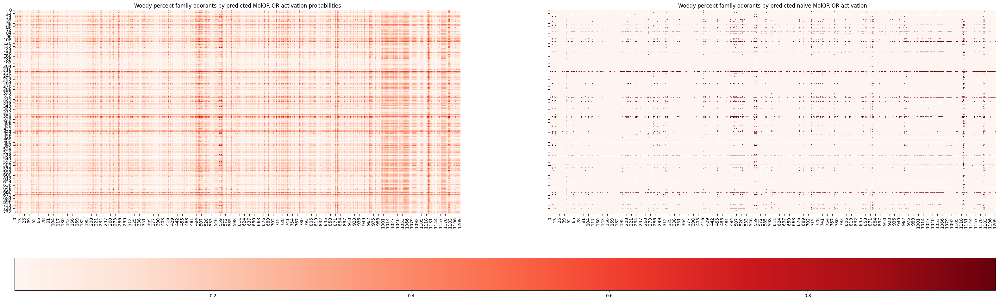

In [81]:
plot_naive_OR_percept(gs_lf_all_percepts, woody_percepts, caption = "Woody percept family", output_file = 'plots/woody_OR_activations.png', intersection=False)

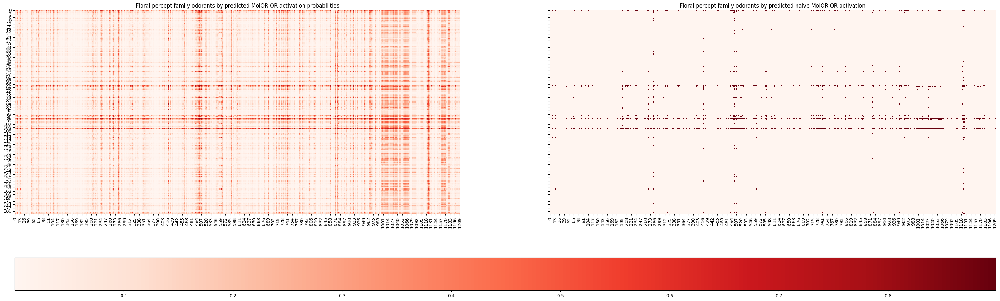

In [78]:
floral = ['muguet', 'lavender', 'jasmin']
plot_naive_OR_percept(gs_lf_all_percepts, floral, caption = "Floral percept family", output_file = 'plots/floral_OR_activations.png')

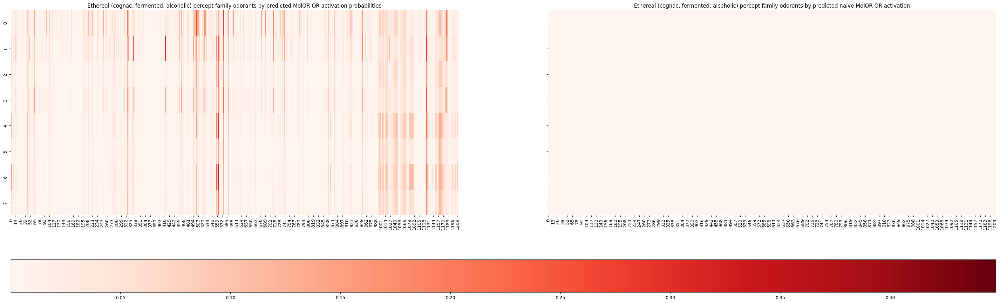

In [77]:
ethereal = ['cognac', 'fermented', 'alcoholic']
plot_naive_OR_percept(gs_lf_all_percepts, ethereal, caption = "Ethereal (cognac, fermented, alcoholic) percept family", output_file = 'plots/ethereal_OR_activations.png', intersection = True)

In [ ]:
plot_naive_OR_percept(gs_lf_all_percepts, ['balsam'], caption = "Balsam percept family", output_file = 'plots/balsam_OR_activations.png', intersection = False)

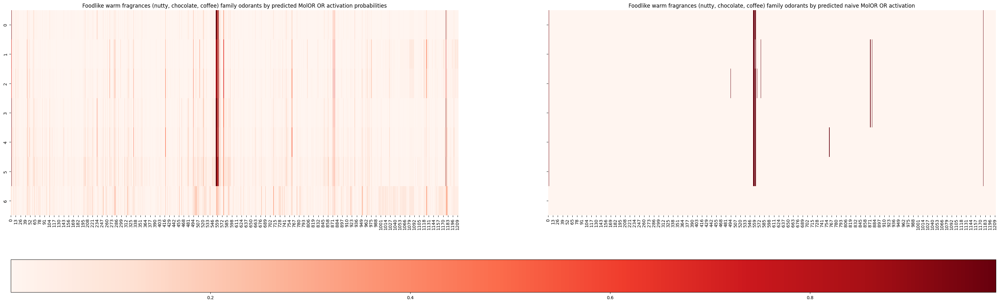

In [72]:
# foodlike: warm
plot_naive_OR_percept(gs_lf_all_percepts, ['chocolate', "coffee", "nutty"], caption = "Foodlike warm fragrances (nutty, chocolate, coffee) family", output_file = 'plots/foodlike_warm_OR_activations_v2.svg', intersection = True)

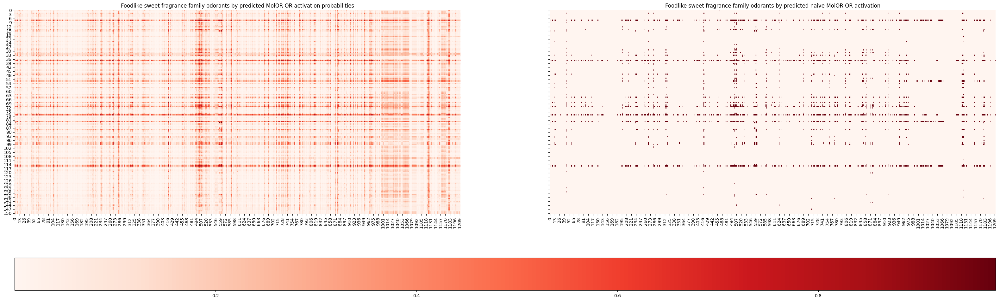

In [76]:
plot_naive_OR_percept(gs_lf_all_percepts, ["honey", "butter"], caption = "Foodlike sweet fragrance family", output_file = 'plots/foodlike_sweet_OR_activations.png', intersection = False)

In [67]:
citrus_family = [col for col in gs_lf_all_percepts.columns if col.__contains__('citrus')]
fruit_family = [col for col in gs_lf_all_percepts.columns if col.__contains__('fruit')]

In [68]:
# remove "fruit", "fruity" from fruit_family
fruit_family.remove('fruit')
fruit_family.remove('fruity')

In [69]:
fruit_family

['grapfruit',
 'starfruit',
 'jackfruit',
 'juicy fruit',
 'fruit tropical fruit',
 'fruit dried fruit',
 'passion fruit',
 'fruit ripe fruit',
 'fruit overripe fruit',
 'grapefruit peel',
 'grapefruit']

In [ ]:
citrus_family

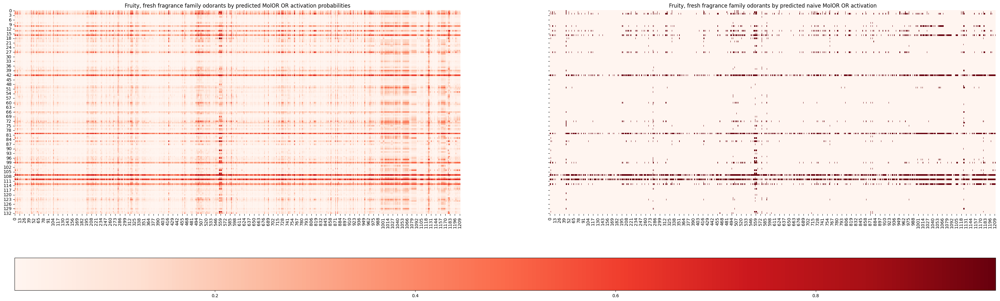

In [75]:
plot_naive_OR_percept(gs_lf_all_percepts, fruit_family, caption = "Fruity, fresh fragrance family", output_file = 'plots/fruit_OR_activations_v2.png', intersection = False)

In [ ]:
plot_naive_OR_percept(gs_lf_all_percepts, ['grapefruit', 'grapefruit peel', 'grapfruit'], caption = "Grapefruit, fresh fragrance family", output_file = 'plots/grapefruit_OR_activations.png', intersection = False)

In [ ]:
# citrus family
plot_naive_OR_percept(gs_lf_all_percepts, citrus_family, caption = "Citrus fragrance family", output_file = 'plots/citrus_OR_activations.png', intersection = False)

## Yanai olfactory subgenome annotations

In [1]:
import pandas as pd
mol_OR = pd.read_csv('data/datasets/genes.csv', delimiter='\t')
mol_OR.head()
mol_OR['Conceptual Sequence'].value_counts()


Conceptual Sequence
MDGENHSVVSEFLFLGLTHSWEIQLLLLVFSSVLYVASITGNILIVFSVTTDPHLHSPMYFLLASLSFIDLGACSVTSPKMIYDLFRKRKVISFGGCIAQIFFIHVVGGVEMVLLIAMAFDRYVALCKPLHYLTIMSPRMCLSFLAVAWTLGVSHSLFQLAFLVNLAFCGPNVLDSFYCDLPRLLRLACTDTYRLQFMVTVNSGFICVGTFFILLISYVFILFTVWKHSSGGSSKALSTLSAHSTVVLLFFGPPMFVYTRPHPNSQMDKFLAIFDAVLTPFLNPVVYTFRNKEMKAAIKRVCKQLVIYKRIS                                           3
MLGL\NLTGVXEFLLLGLSEDPELQPALALLSLSLSMYLVTVLRNLFSILAVSSDCPLHTPMYFFLSNLCWPDIGFTSAMVPKMIVDTQSHSRVISHAGCLTQMSFLLLVACIEGMLLTVMAYDCFVAICRPLHYPVIVNPHLCVFFVLVSFFLSLLDSQLHSWIVLQLTIIKNVEISNLVCDPSQLLKLACSDSVINNIFIYFDSTMFGFLPISGIFLSYYKIVPSILRISSSDGKYKAFSTCGCHLAVVCWFYGTGIGMYLTSAVSPPPRNGVVASVMYAVV/TPMLNLFICSLRNRDIQSALRRLGSRAFESHDLFHPFSCV                              2
MSVIEANNISGPVSEFILLGFP\SCCRETKILLFVVFSLIYLLTLMGNTSIICAVWSSQKLHTPMYILLANFSFLEICCIS/VXCPKMLANLISHIKSISYAGCLLQFFYFSMCAAEGYFLSVMSFDRFLTICRPLHYPTVMTHHLCVRLVAFCRAGGFLSILMPAVLMSRVPFCGPNITDHFFCNLGPLLALSCAPVPKTTLTCATVSSLIIFITFLYILGSHILVLRAVLWVPAGSGRNKAFSTCASHFLVVSFFYGSVMVMYV

In [2]:
import pandas as pd
mol_OR = pd.read_csv('data/datasets/genes.csv', delimiter='\t')
mol_OR.head()
top_seqs = mol_OR['Conceptual Sequence'].value_counts().keys().tolist()
len(top_seqs)

845

In [4]:
# filters for sequences to keep note of (ID's)

top_seqs = [seq.replace('\\', '') for seq in top_seqs] ## get rid of gaps for embedding
top_seqs = [seq.replace('/', '') for seq in top_seqs] ## get rid of gaps for embedding
top_seqs = [seq.replace('*', '') for seq in top_seqs] ## get rid of gaps for embedding
top_seqs = [seq.replace('trand=+', '') for seq in top_seqs] ## get rid of gaps for embedding
top_seqs = [seq.replace('strand=-', '') for seq in top_seqs] ## get rid of gaps for embedding
for i, seq in enumerate(top_seqs):
    if len(seq.split("=")) != 1:
        top_seqs[i] = seq.split("|")[1]


In [3]:
# sort mol_OR in terms of top_seqs
mol_OR = mol_OR.set_index('Conceptual Sequence')
mol_OR = mol_OR.loc[top_seqs]
mol_OR = mol_OR.reset_index()
mol_OR.head()

,Conceptual Sequence,Id,Symbol,Family Id,Sub Family,Pseduo Gene,Comments,Pseduo Probability,Nucleotide Sequence,Clic,Horde Id,Chromosome,Start,End,Strand,Synteny,Name
0,MDGENHSVVSEFLFLGLTHSWEIQLLLLVFSSVLYVASITGNILIV...,4,OR4F29,4,F,0,NaN,0.58,ATGGATGGAGAGAATCACTCAGTGGTATCTGAGTTTTTGTTTCTGG...,0,1059,1,450742.0,451677.0,+,0.58 (pseudogene),1@0b
1,MDGENHSVVSEFLFLGLTHSWEIQLLLLVFSSVLYVASITGNILIV...,5,OR4F16,4,F,0,NaN,0.58,ATGGATGGAGAGAATCACTCAGTGGTATCTGAGTTTTTGTTTCTGG...,0,594,1,685719.0,686654.0,-,0.58 (pseudogene),1@1
2,MDGENHSVVSEFLFLGLTHSWEIQLLLLVFSSVLYVASITGNILIV...,157,OR4F3,4,F,0,NaN,0.00,ATGGATGGAGAGAATCACTCAGTGGTATCTGAGTTTTTGTTTCTGG...,11,763,5,181367287.0,181368222.0,+,NaN,5@181b
3,MLGL\NLTGVXEFLLLGLSEDPELQPALALLSLSLSMYLVTVLRNL...,232,OR7E125P,7,E,1,NaN,0.00,ATGTTGGGACTAATATCTCACAGGTGTCTGAGAATTCCTCCTCCTG...,0,868,8,7246619.0,7247587.0,-,NaN,8@7a
4,MLGL\NLTGVXEFLLLGLSEDPELQPALALLSLSLSMYLVTVLRNL...,234,OR7E154P,7,E,1,NaN,0.00,ATGTTGGGACTAATATCTCACAGGTGTCTGAGAATTCCTCCTCCTG...,0,1046,8,7705164.0,7706132.0,-,NaN,8@8a


In [5]:
# drop rows with duplicate "Conceptual Sequence"
mol_OR = mol_OR.drop_duplicates(subset=['Conceptual Sequence'])
mol_OR = mol_OR.reset_index()
mol_OR.head()

,index,Conceptual Sequence,Id,Symbol,Family Id,Sub Family,Pseduo Gene,Comments,Pseduo Probability,Nucleotide Sequence,Clic,Horde Id,Chromosome,Start,End,Strand,Synteny,Name
0,0,MDGENHSVVSEFLFLGLTHSWEIQLLLLVFSSVLYVASITGNILIV...,4,OR4F29,4,F,0,NaN,0.58,ATGGATGGAGAGAATCACTCAGTGGTATCTGAGTTTTTGTTTCTGG...,0,1059,1,450742.0,451677.0,+,0.58 (pseudogene),1@0b
1,3,MLGL\NLTGVXEFLLLGLSEDPELQPALALLSLSLSMYLVTVLRNL...,232,OR7E125P,7,E,1,NaN,0.00,ATGTTGGGACTAATATCTCACAGGTGTCTGAGAATTCCTCCTCCTG...,0,868,8,7246619.0,7247587.0,-,NaN,8@7a
2,5,MSVIEANNISGPVSEFILLGFP\SCCRETKILLFVVFSLIYLLTLM...,755,OR11J6P,11,J,1,NaN,0.00,ATGAGTGTCATAGAAGCCAATAACATTTCTGGGCCTGTGAGTGAAT...,0,1024,15,21542999.0,21543958.0,-,NaN,15@22
3,7,MGENQTMVTEFLLLGFLLGPRIQMLLFGLFSLFYIFTLLGNGAILG...,226,OR2A42,2,A,0,NaN,0.04,ATGGGGGAAAATCAGACAATGGTCACAGAGTTCCTCCTACTGGGAT...,16,1045,7,144231914.0,144232843.0,-,0.04 (functional),7@144
4,9,MVKNQTMVTEFLLLGFLLGPRIQMLLFGLFSLFYVFTLLGNGTILG...,227,OR2A20P,2,A,1,NaN,0.00,ATGGTGAAAAATCAGACAATGGTCACAGAGTTCCTCCTACTGGGAT...,16,772,7,144250674.0,144251603.0,-,NaN,7@144


In [6]:
len(top_seqs), len(mol_OR)

(845, 845)

In [7]:
max(mol_OR.index), min(mol_OR.index)

(844, 0)

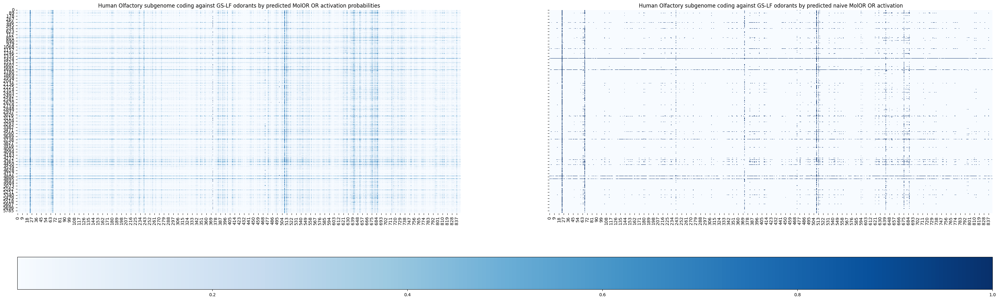

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import torch

logits_path = 'data/datasets/olfactory_subgenome_OR_logits.pt'
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
OR_preds = torch.sigmoid(OR_logits)
OR_activations = torch.round(OR_preds)

## Filter out columns with >30% rows being 1 in OR_preds
"""
threshold = 0.3
mask = OR_activations.mean(dim=0) < threshold
OR_preds = OR_preds[:, mask]
OR_activations = OR_activations[:, mask]
"""

## Filter out rows with > 50% columns being 1 in OR_preds
#threshold = 0.5
#mask = OR_preds.mean(dim=1) < threshold
#OR_preds = OR_preds[mask]
#OR_activations = OR_activations[mask]

#percept_idx = get_percept_ids(dataset, percepts, intersection)
#OR_preds = OR_preds[percept_idx]
#OR_activations = OR_activations[percept_idx]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40,12), sharex=True, sharey=True)

cmap = sns.color_palette("Blues", as_cmap=True)

caption = "Human Olfactory subgenome coding against GS-LF"

im = sns.heatmap(OR_preds, cmap = cmap, fmt='d', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax1)
ax1.set_title(f"{caption} odorants by predicted MolOR OR activation probabilities")
#ax1.set_ylabel("Vanilla, creamy Molecules")
#plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
sns.heatmap(OR_activations, cmap = cmap, fmt='.2f', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax2)
ax2.set_title(f"{caption} odorants by predicted naive MolOR OR activation")

mappable = im.get_children()[0]
plt.colorbar(mappable, ax = [ax1,ax2],orientation = 'horizontal', aspect=30)
#plt.savefig(output_file)
plt.show()

### Viewing activations by Family ID

In [9]:
mol_OR.columns

Index(['index', 'Conceptual Sequence', 'Id', 'Symbol', 'Family Id',
       'Sub Family', 'Pseduo Gene', 'Comments', 'Pseduo Probability',
       'Nucleotide Sequence', 'Clic', 'Horde Id', 'Chromosome', 'Start', 'End',
       'Strand', 'Synteny', 'Name'],
      dtype='object')

In [10]:
mol_OR.loc[353]

index                                                                360
Conceptual Sequence    MTVKSHSIVTEFSLRGLTKQPDLQLFHFLIFLDIHMVTMVGNLGMI...
Id                                                                   651
Symbol                                                            OR8A2P
Family Id                                                              8
Sub Family                                                             A
Pseduo Gene                                                            1
Comments                                                             NaN
Pseduo Probability                                                   0.0
Nucleotide Sequence    ATGACTGTCAAAAGTCATTCTATAGTGACAGAGTTCAGTCTCAGGG...
Clic                                                                  29
Horde Id                                                             895
Chromosome                                                            11
Start                                              

In [11]:
top_seqs[353]

'MTVKSHSIVTEFSLRGLTKQPDLQLFHFLIFLDIHMVTMVGNLGMITLICLNSQLHTPMYYFFSNLSLLDLCYSSITNPKMLVNFVLKKSIISYAGYMSXFYFFLVFVIARCYMLMVKACDHYVAICCPLLCNVIMSHVTCSLMVAVVYTMGLVVSTIETGLILKLPYCELLTSRCFCDILPLMKLSXSSAYDVEMAVFFFARFNLRIMILTVLVSYTFILFSILHISTTEGRSKVFSTCSFHLAAIGMFHGXTAFRYLKPAITSSLAQENVASVFYTTVIYVPNPLMYSLKNKDVKAAMQKTLRSKFCCRCNYLELLINP'

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import torch

def plot_OR_subgenome(dataset, logits_path = 'data/datasets/olfactory_subgenome_OR_logits.pt', caption = "Human Olfactory subgenome coding against GS-LF", index = None, percept_idx = None, filter_promiscous_mols = False, thresh = 0.5, OR_families = None, output_file = "test.svg"):
    # Modify activation levels to show differences between pleasant and unpleasant smells
    OR_logits = torch.load(logits_path).cpu()
    #OR_logits = OR_logits[molecules_idx]
    OR_preds = torch.sigmoid(OR_logits)
    OR_activations = torch.round(OR_preds)

    if index is None:
        index = [i for i in range(len(dataset))]

    # we want to rearrange the indices based on 
    OR_preds, OR_activations = OR_preds[:, index], OR_activations[:, index]

    ## Filter out columns with >30% rows being 1 in OR_preds
    """
    threshold = 0.3
    mask = OR_activations.mean(dim=0) < threshold
    OR_preds = OR_preds[:, mask]
    OR_activations = OR_activations[:, mask]
    """
    # have masks be None (aka no filtering, so all molecules are shown, so a list of 1's of size OR_preds.shape[0])
    n_mols = OR_preds.shape[0]
    mask_percept = percept_idx if percept_idx is not None else [i for i in range(n_mols)]
    mask_promiscous_mols = [i for i in range(n_mols)]
    
    #Filter out rows with > 50% columns being 1 in OR_preds
    if filter_promiscous_mols:
        threshold = thresh
        mask_promiscous_mols = OR_preds.mean(dim=1) < threshold

        # convert to list of indices
        mask_promiscous_mols = [i for i, x in enumerate(mask_promiscous_mols) if x]
    
    # get the intersection of indices in the two masks
    mask = list(set(mask_percept) & set(mask_promiscous_mols))

    OR_preds = OR_preds[mask]
    OR_activations = OR_activations[mask]
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40,12), sharex=True, sharey=True)

    cmap = sns.color_palette("Blues", as_cmap=True)

    im = sns.heatmap(OR_preds, cmap = cmap, fmt='d', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax1)
    ax1.set_title(f"{caption} odorants by predicted MolOR OR activation probabilities")
    #ax1.set_ylabel("Vanilla, creamy Molecules")
    #plt.title('Vanilla, creamy molecules by predicted OR activation', fontdict={'fontsize': 24})
    sns.heatmap(OR_activations, cmap = cmap, fmt='.2f', cbar=False, cbar_ax=None, cbar_kws={'ticks': [0, 1], 'label': 'Activation Level', "orientation": "horizontal"}, ax=ax2)
    ax2.set_title(f"{caption} odorants by predicted naive MolOR OR activation")

    # Add custom annotations for OR families if provided
    if OR_families:
        total_columns = sum([fam[1] for fam in OR_families])
        assert total_columns == OR_preds.shape[1], "Total OR family columns must match the number of columns in OR_preds"

        current_pos = 0

        
        prev_accounted_for = False
        n_fams = len(OR_families)
        colors = plt.cm.get_cmap('tab10', len(OR_families)).colors
        # find some way to check if the current family_size is too small and will overlap with the next, then print label as id-id+1, and know to skip the next one.
        for i, (id, family_size) in enumerate(OR_families):
            if prev_accounted_for == True:
                prev_accounted_for = False
                continue
            elif i != n_fams - 1 and family_size + OR_families[i+1][1] < 11: # if the number of receptors in the current family and next are below some number, just group together for viz
                family_label = f"{id}-{OR_families[i+1][0]}"
                ax1.text(current_pos + family_size / 2, OR_preds.shape[0] + 500/(n_mols / OR_preds.shape[0]), family_label, ha='center', va='center', fontsize=11, color='black', fontweight='bold')
                ax2.text(current_pos + family_size / 2, OR_preds.shape[0] + 500/(n_mols / OR_preds.shape[0]), family_label, ha='center', va='center', fontsize=11, color='black', fontweight='bold')
                if i > 0:  # Draw a vertical line to separate families, with the color white
                    color = 'black'
                    ax1.axvline(current_pos, color=color, linewidth=2)
                    ax2.axvline(current_pos, color=color, linewidth=2)
                    #ax1.axvline(current_pos, color=colors[i], linewidth=2)
                    #ax2.axvline(current_pos, color=colors[i], linewidth=2)
                current_pos += family_size + OR_families[i+1][1]
                prev_accounted_for = True
            else:
                family_label = f"{id}"
                ax1.text(current_pos + family_size / 2, OR_preds.shape[0] + 500/(n_mols / OR_preds.shape[0]), family_label, ha='center', va='center', fontsize=11, color='black', fontweight='bold')
                ax2.text(current_pos + family_size / 2, OR_preds.shape[0] + 500/(n_mols / OR_preds.shape[0]), family_label, ha='center', va='center', fontsize=11, color='black', fontweight='bold')
                if i > 0:  # Draw a vertical line to separate families
                    color = 'black'
                    ax1.axvline(current_pos, color=color, linewidth=2)
                    ax2.axvline(current_pos, color=color, linewidth=2)
                    
                    #ax1.axvline(current_pos, color=colors[i], linewidth=2)
                    #ax2.axvline(current_pos, color=colors[i], linewidth=2)
                current_pos += family_size
        
        # find some way to check if the current family_size is too small and will overlap with the next, then print label as id-id+1, and know to skip the next one.
        """
        for id, family_size in OR_families:
            family_label = f"{id}"
            ax1.text(current_pos + family_size / 2, OR_preds.shape[0] + 500, family_label, ha='center', va='center', fontsize=12, color='black', fontweight='bold')
            ax2.text(current_pos + family_size / 2, OR_preds.shape[0] + 500, family_label, ha='center', va='center', fontsize=12, color='black', fontweight='bold')
            current_pos += family_size
        """

    mappable = im.get_children()[0]
    plt.colorbar(mappable, ax = [ax1,ax2],orientation = 'horizontal', aspect=30)
    #plt.savefig(output_file)
    plt.show()

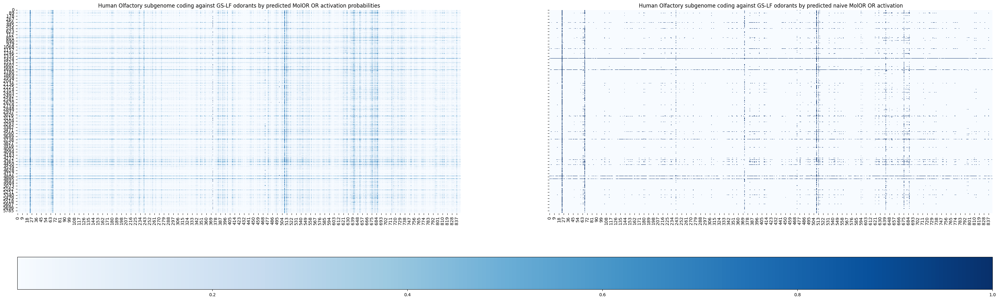

In [13]:
plot_OR_subgenome(dataset = mol_OR)

In [14]:
mol_OR.head()

,index,Conceptual Sequence,Id,Symbol,Family Id,Sub Family,Pseduo Gene,Comments,Pseduo Probability,Nucleotide Sequence,Clic,Horde Id,Chromosome,Start,End,Strand,Synteny,Name
0,0,MDGENHSVVSEFLFLGLTHSWEIQLLLLVFSSVLYVASITGNILIV...,4,OR4F29,4,F,0,NaN,0.58,ATGGATGGAGAGAATCACTCAGTGGTATCTGAGTTTTTGTTTCTGG...,0,1059,1,450742.0,451677.0,+,0.58 (pseudogene),1@0b
1,3,MLGL\NLTGVXEFLLLGLSEDPELQPALALLSLSLSMYLVTVLRNL...,232,OR7E125P,7,E,1,NaN,0.00,ATGTTGGGACTAATATCTCACAGGTGTCTGAGAATTCCTCCTCCTG...,0,868,8,7246619.0,7247587.0,-,NaN,8@7a
2,5,MSVIEANNISGPVSEFILLGFP\SCCRETKILLFVVFSLIYLLTLM...,755,OR11J6P,11,J,1,NaN,0.00,ATGAGTGTCATAGAAGCCAATAACATTTCTGGGCCTGTGAGTGAAT...,0,1024,15,21542999.0,21543958.0,-,NaN,15@22
3,7,MGENQTMVTEFLLLGFLLGPRIQMLLFGLFSLFYIFTLLGNGAILG...,226,OR2A42,2,A,0,NaN,0.04,ATGGGGGAAAATCAGACAATGGTCACAGAGTTCCTCCTACTGGGAT...,16,1045,7,144231914.0,144232843.0,-,0.04 (functional),7@144
4,9,MVKNQTMVTEFLLLGFLLGPRIQMLLFGLFSLFYVFTLLGNGTILG...,227,OR2A20P,2,A,1,NaN,0.00,ATGGTGAAAAATCAGACAATGGTCACAGAGTTCCTCCTACTGGGAT...,16,772,7,144250674.0,144251603.0,-,NaN,7@144


In [15]:
# Sort mol_OR such that within each group of rows beling to a unique "Family Id", the rows are sorted by "Sub Family"
mol_OR = mol_OR.sort_values(by=["Family Id", "Sub Family"])
mol_OR.head(n=50)


,index,Conceptual Sequence,Id,Symbol,Family Id,Sub Family,Pseduo Gene,Comments,Pseduo Probability,Nucleotide Sequence,Clic,Horde Id,Chromosome,Start,End,Strand,Synteny,Name
216,223,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...,781,OR1A1,1,A,0,"Segregating Pseudo Gene, a nonsynonymous SNP i...",0.00,ATGAGGGAAAATAACCAGTCCTCTACACTGGAATTCATCCTCCTGG...,39,893,17,3215621.0,3216547.0,+,NaN,17@3b
239,246,MKKENQSFNLDFILLGVTSQQEQNNVFFVIFLCIYPITLTGNLLII...,780,OR1A2,1,A,0,NaN,0.07,ATGAAGAAAGAAAATCAATCCTTTAACCTGGATTTTATTCTCCTGG...,39,894,17,3197519.0,3198445.0,+,0.07 (functional),17@3b
280,287,MHQGNXTTVSKFFLLGITTKPKEQQFIFMLFLCTYLVTMVRNLLII...,845,OR1AA1P,1,AA,1,NaN,0.00,ATGCACCAAGGAAATTGAACTACTGTCTCTAAATTCTTTCTCCTGG...,48,95,X,131424301.0,131425268.0,+,NaN,X@131a
269,276,WVSEFLLLGLLEELMLILFLSIFLVTGLKNLLILLIIPAIATDTRL...,834,OR1AB1P,1,AB,1,Disrupted by Alu repeat,0.00,ACTCACAGTCAAGACCTTCCGTCTGGTAATCTGGTAACATCTTGCC...,46,385,19,16051977.0,16052715.0,+,NaN,19@16c
765,772,MMSFAPNASHSPVFLLLGFSRANISYTLLFFLFLAIYLTTILGNVT...,275,OR1B1,1,B,0,"Segregating Pseudo Gene, a nonsynonymous SNP r...",0.28,ATGATGAGCTTTGCCCCTAATGCTTCACACTCTCCGGTTTTTTTGC...,21,801,9,122628582.0,122629535.0,-,0.28 (functional),9@125
553,560,MEKRNLTVVREFVLLGLPSSAEQQHLLSVLFLCMYLATTLGNMLII...,51,OR1C1,1,C,0,NaN,0.01,ATGGAAAAAAGAAATCTAACAGTTGTCAGGGAATTCGTCCTTCTGG...,5,808,1,247757465.0,247758406.0,-,0.01 (functional),1@248
217,224,MDGDNQSENSQFLLLGISESPEQQQILFWMFLSMYLVTVLGNVLII...,782,OR1D4,1,D,0,NaN,0.00,ATGGATGGAGATAACCAGAGTGAGAACTCACAGTTCCTTCTCCTGG...,39,888,17,3240676.0,3241611.0,+,NaN,17@3b
218,225,MDGGNQSEGSEFLLLGISESPEQQQMLFWMFLVRYLVTVLGNVLII...,783,OR1D3P,1,D,1,NaN,0.00,ATGGATGGAGGCAACCAGAGTGAAGGTTCAGAGTTCCTTCTCCTGG...,39,613,17,3265611.0,3266562.0,+,NaN,17@3b
263,270,MDGDNQSENSQFLLLGISESPEQQRILFWMFLSMYLVTVLGNVLII...,775,OR1D5,1,D,0,NaN,0.00,ATGGATGGAGATAACCAGAGTGAGAACTCACAGTTCCTTCTCCTGG...,39,3,17,3062672.0,3063607.0,-,NaN,17@3b
264,271,MDGGNQSEGSEFLLLGMSESPEQQRILFWMFLSMYLVTVVGNVLII...,776,OR1D2,1,D,0,NaN,0.00,ATGGATGGAGGCAACCAGAGTGAAGGTTCAGAGTTCCTTCTCCTGG...,39,809,17,3092061.0,3092996.0,-,NaN,17@3b


In [16]:
mol_OR.loc[762]

index                                                                769
Conceptual Sequence    MERINHTSSVSEFILLGLSSRPEDQKTLFVLFLIVYLVTITGNLLI...
Id                                                                   272
Symbol                                                             OR1L8
Family Id                                                              1
Sub Family                                                             L
Pseduo Gene                                                            0
Comments                                                             NaN
Pseduo Probability                                                  0.01
Nucleotide Sequence    ATGGAAAGAATCAACCACACCAGCAGTGTCTCCGAGTTTATCCTCC...
Clic                                                                  21
Horde Id                                                             455
Chromosome                                                             9
Start                                              

In [17]:
top_seqs[762]

'MERINHTSSVSEFILLGLSSRPEDQKTLFVLFLIVYLVTITGNLLIILAIRFNPHLQTPMYFFLSFLSLTDICFTTSVVPKMLMNFLSEKKTISYAGCLTQMYFLYALGNSDSCLLAVMAFDRYVAVCDPFHYVTTMSHHHCVLLVAFSCSFPHLHSLLHTLLLNRLTFCDSNVIHHFLCDLSPVLKLSCSSIFVNEIVQMTEAPIVLVTRFLCIAFSYIRILTTVLKIPSTSGKRKAFSTCGFYLTVVTLFYGSIFCVYLQPPSTYAVKDHVATIVYTVLSSMLNPFIYSLRNKDLKQGLRKLMSKRS'

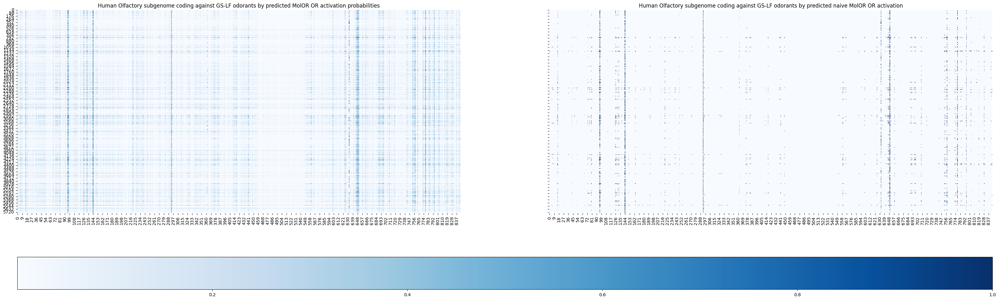

In [18]:
## OR activations are sorted by Family + sub-family
fam_ID_idx = mol_OR.index

plot_OR_subgenome(dataset = mol_OR, index = fam_ID_idx, filter_promiscous_mols = True, thresh = 0.3)

In [19]:
# Get value counts of mol_OR['Family Id'], but sorted in ascending order of key
fam_ID_counts = mol_OR['Family Id'].value_counts().sort_index()
fam_ID_counts

Family Id
1      39
2     111
3       6
4     124
5     112
6      51
7     109
8      47
9      23
10     65
11     24
12      3
13     22
14      6
51     44
52     49
55      1
56      9
Name: count, dtype: int64

In [20]:
# convert to list of lists, where each sublist contains the Family ID, and the count.
fam_ID_counts = [[key, value] for key, value in fam_ID_counts.items()]
fam_ID_counts


[[1, 39],
 [2, 111],
 [3, 6],
 [4, 124],
 [5, 112],
 [6, 51],
 [7, 109],
 [8, 47],
 [9, 23],
 [10, 65],
 [11, 24],
 [12, 3],
 [13, 22],
 [14, 6],
 [51, 44],
 [52, 49],
 [55, 1],
 [56, 9]]

/tmp/ipykernel_916930/1353105420.py:66: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(OR_families)).colors


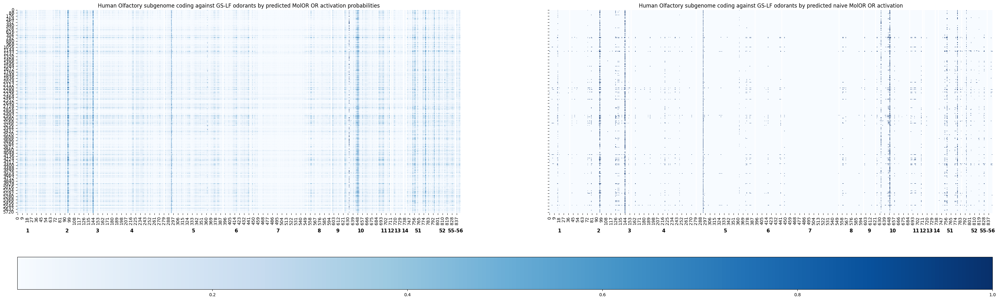

In [23]:
plot_OR_subgenome(dataset = mol_OR, index = fam_ID_idx, filter_promiscous_mols = True, thresh = 0.3, OR_families = fam_ID_counts, output_file = "plots/OR_subgenome_sorted_family_v3_black.svg")

In [ ]:
# get id's of all molecules with a woody percept
def get_percept_ids(gs_lf_all_percepts, percepts, intersection= False):
    idx = None if intersection is True else []
    for percept in percepts:
        # grab all indices that don't already exist in idx and append
        percept_lst = gs_lf_all_percepts[gs_lf_all_percepts[percept] == 1].index
        if intersection == True:
            if idx is None:
                idx = percept_lst
            else:
                idx = idx.intersection(percept_lst)
        else:
            idx = list(set(idx) | set(percept_lst))

    return idx

/tmp/ipykernel_830579/310497925.py:5: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  gs_lf_all_percepts = pd.read_csv('data/datasets/goodscents_leffingwell_all_percepts.csv')
/tmp/ipykernel_830579/3367247316.py:66: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(OR_families)).colors


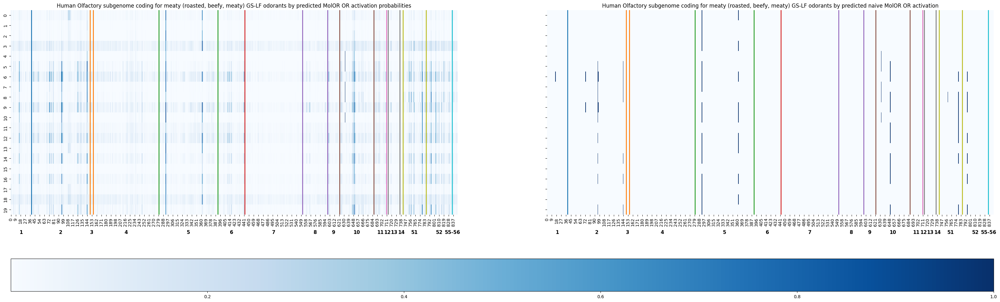

In [29]:
import pandas as pd

meaty_percepts = ['roasted', 'beefy', 'meaty']

gs_lf_all_percepts = pd.read_csv('data/datasets/goodscents_leffingwell_all_percepts.csv')

gs_lf_all_percepts.head()

caption = "Human Olfactory subgenome coding for meaty (roasted, beefy, meaty) GS-LF"

percept_idx = get_percept_ids(gs_lf_all_percepts=gs_lf_all_percepts, percepts = meaty_percepts, intersection = True)

plot_OR_subgenome(dataset = mol_OR, index = fam_ID_idx, caption = caption, filter_promiscous_mols = True, thresh = 0.3, percept_idx=percept_idx, OR_families = fam_ID_counts)

/tmp/ipykernel_830579/3367247316.py:66: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(OR_families)).colors


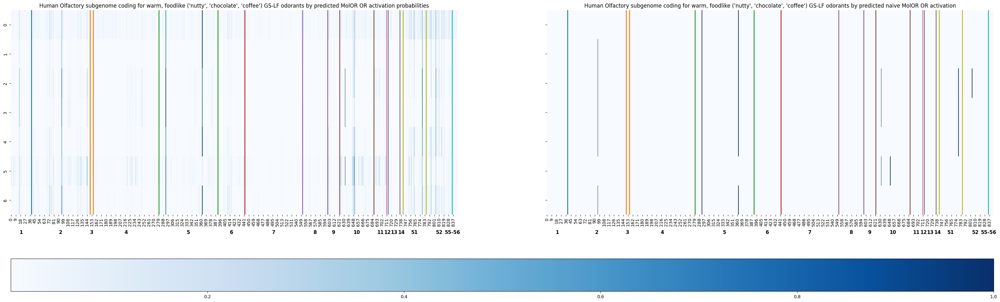

In [30]:
warm_percepts = ['nutty', 'chocolate', 'coffee']

caption = "Human Olfactory subgenome coding for warm, foodlike ('nutty', 'chocolate', 'coffee') GS-LF"

percept_idx = get_percept_ids(gs_lf_all_percepts=gs_lf_all_percepts, percepts = warm_percepts, intersection = True)

plot_OR_subgenome(dataset = mol_OR, index = fam_ID_idx, caption = caption, filter_promiscous_mols = True, thresh = 0.3, percept_idx=percept_idx, OR_families = fam_ID_counts)

/tmp/ipykernel_3076712/2226581306.py:64: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(OR_families)).colors


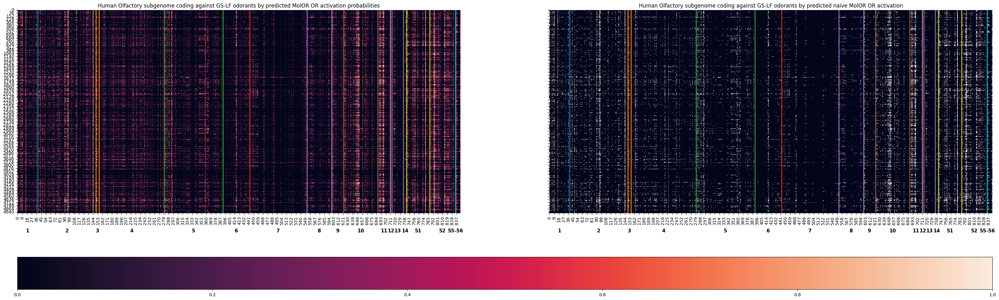

In [26]:
plot_OR_subgenome(dataset = mol_OR, logits_path='data/datasets/weighted_loss_olfactory_subgenome_OR_logits.pt', index = fam_ID_idx, filter_promiscous_mols = True, thresh = 0.3, OR_families = fam_ID_counts)

### Psuedogene vs functional protein-coding OR gene coding

In [51]:
# Get value counts of mol_OR['Family Id'], but sorted in ascending order of key
psuedogene_counts = mol_OR['Pseduo Gene'].value_counts().sort_index()
psuedogene_counts


Pseduo Gene
0    386
1    459
Name: count, dtype: int64

In [52]:
# convert to list of lists, where each sublist contains the Family ID, and the count.
psuedo_counts = [[key, value] for key, value in psuedogene_counts.items()]
psuedo_counts


[[0, 386], [1, 459]]

In [53]:
# Sort mol_OR such that within each group of rows beling to a unique "Family Id", the rows are sorted by "Sub Family"
mol_OR = mol_OR.sort_values(by=["Pseduo Gene", "Family Id", "Sub Family"])
mol_OR.head(n=50)


,index,Conceptual Sequence,Id,Symbol,Family Id,Sub Family,Pseduo Gene,Comments,Pseduo Probability,Nucleotide Sequence,Clic,Horde Id,Chromosome,Start,End,Strand,Synteny,Name
216,223,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...,781,OR1A1,1,A,0,"Segregating Pseudo Gene, a nonsynonymous SNP i...",0.00,ATGAGGGAAAATAACCAGTCCTCTACACTGGAATTCATCCTCCTGG...,39,893,17,3215621.0,3216547.0,+,NaN,17@3b
239,246,MKKENQSFNLDFILLGVTSQQEQNNVFFVIFLCIYPITLTGNLLII...,780,OR1A2,1,A,0,NaN,0.07,ATGAAGAAAGAAAATCAATCCTTTAACCTGGATTTTATTCTCCTGG...,39,894,17,3197519.0,3198445.0,+,0.07 (functional),17@3b
765,772,MMSFAPNASHSPVFLLLGFSRANISYTLLFFLFLAIYLTTILGNVT...,275,OR1B1,1,B,0,"Segregating Pseudo Gene, a nonsynonymous SNP r...",0.28,ATGATGAGCTTTGCCCCTAATGCTTCACACTCTCCGGTTTTTTTGC...,21,801,9,122628582.0,122629535.0,-,0.28 (functional),9@125
553,560,MEKRNLTVVREFVLLGLPSSAEQQHLLSVLFLCMYLATTLGNMLII...,51,OR1C1,1,C,0,NaN,0.01,ATGGAAAAAAGAAATCTAACAGTTGTCAGGGAATTCGTCCTTCTGG...,5,808,1,247757465.0,247758406.0,-,0.01 (functional),1@248
217,224,MDGDNQSENSQFLLLGISESPEQQQILFWMFLSMYLVTVLGNVLII...,782,OR1D4,1,D,0,NaN,0.00,ATGGATGGAGATAACCAGAGTGAGAACTCACAGTTCCTTCTCCTGG...,39,888,17,3240676.0,3241611.0,+,NaN,17@3b
263,270,MDGDNQSENSQFLLLGISESPEQQRILFWMFLSMYLVTVLGNVLII...,775,OR1D5,1,D,0,NaN,0.00,ATGGATGGAGATAACCAGAGTGAGAACTCACAGTTCCTTCTCCTGG...,39,3,17,3062672.0,3063607.0,-,NaN,17@3b
264,271,MDGGNQSEGSEFLLLGMSESPEQQRILFWMFLSMYLVTVVGNVLII...,776,OR1D2,1,D,0,NaN,0.00,ATGGATGGAGGCAACCAGAGTGAAGGTTCAGAGTTCCTTCTCCTGG...,39,809,17,3092061.0,3092996.0,-,NaN,17@3b
223,230,MMGQNQTSISDFLLLGLPIQPEQQNLCYALFLAMYLTTLLGNLLII...,788,OR1E1,1,E,0,NaN,0.00,ATGATGGGACAAAATCAAACCAGCATCTCAGACTTCCTGCTCCTGG...,39,180,17,3397469.0,3398410.0,-,NaN,17@3b
225,232,MMGQNQTSISDFLLLGLPIQPEQQNLCYALFLAMYLTTLLGNLLII...,790,OR1E2,1,E,0,NaN,0.14,ATGATGGGACAAAATCAAACCAGCATCTCAGACTTCCTGCTCCTGG...,39,189,17,3432873.0,3433841.0,-,0.14 (functional),17@3b
260,267,MSGTNQSSVSEFLLLGLSRQPQQQHLLFVFFLSMYLATVLGNLLII...,772,OR1F1,1,F,0,"Segregating Pseudo Gene, a nonsynonymous SNP i...",0.36,ATGAGCGGGACAAACCAGTCGAGTGTCTCCGAGTTCCTCCTCCTGG...,38,308,16,3204247.0,3205182.0,+,0.36 (functional),16@3


In [54]:
## FETCH rows 370-420 of mol_OR
mol_OR[370:420]


,index,Conceptual Sequence,Id,Symbol,Family Id,Sub Family,Pseduo Gene,Comments,Pseduo Probability,Nucleotide Sequence,Clic,Horde Id,Chromosome,Start,End,Strand,Synteny,Name
840,847,MSASNITLTHPTAFLLVGIPGLEHLHIWISIPFCLAYTLALLGNCT...,298,OR52K2,52,K,0,NaN,0.00,ATGTCAGCCTCCAATATCACCTTAACACATCCAACTGCCTTCTTGT...,23,437,11,4449340.0,4450281.0,+,NaN,11@5
842,849,MLPSNITSTHPAVFLLVGIPGLEHLHAWISIPFCFAYTLALLGNCT...,300,OR52K1,52,K,0,NaN,0.04,ATGCTTCCCTCTAATATCACCTCAACACATCCAGCTGTCTTTTTGT...,23,435,11,4488901.0,4489842.0,+,0.04 (functional),11@5
717,724,MLLSNSSWRLSQPSFLLVGIPGLEESQHWIALPLGILYLLALVGNV...,385,OR52L1,52,L,0,"Segregating Pseudo Gene, a nonsynonymous SNP i...",0.00,ATGCTCCTTAGCAATTCAAGCTGGAGGCTATCCCAGCCTTCTTTTC...,23,143,11,5985944.0,5986885.0,-,NaN,11@6
833,840,MLTFHNVCSVPSSFWLTGIPGLESLHVWLSIPFGSMYLVAVVGNVT...,302,OR52M1,52,M,0,NaN,0.12,ATGCTCACTTTTCATAATGTCTGCTCAGTACCCAGCTCCTTCTGGC...,23,366,11,4545191.0,4546141.0,+,0.12 (functional),11@5
651,658,MLTLNKTDLIPASFILNGVPGLEDTQLWISFPFCSMYVVAMVGNCG...,371,OR52N4,52,N,0,"Segregating Pseudo Gene, a nonsynonymous SNP r...",0.04,ATGCTAACACTGAATAAAACAGACCTAATACCAGCTTCATTTATTC...,23,249,11,5754741.0,5755703.0,+,0.04 (functional),11@6
653,660,MPLFNSLCWFPTIHVTPPSFILNGIPGLERVHVWISLPLCTMYIIF...,373,OR52N5,52,N,0,NaN,0.07,ATGCCTCTATTTAATTCATTATGCTGGTTTCCAACAATTCATGTGA...,23,252,11,5777663.0,5778634.0,-,0.07 (functional),11@6
654,661,MSFLNGTSLTPASFILNGIPGLEDVHLWISFPLCTMYSIAITGNFG...,374,OR52N1,52,N,0,NaN,0.31,ATGTCATTTCTAAATGGCACCAGCCTAACTCCAGCTTCATTCATCC...,23,223,11,5787857.0,5788816.0,-,0.31 (functional),11@6
656,663,MSGDNSSSLTPGFFILNGVPGLEATHIWISLPFCFMYIIAVVGNCG...,376,OR52N2,52,N,0,NaN,0.09,ATGTCTGGGGACAACAGCTCCAGCCTGACCCCAGGATTCTTTATCT...,23,237,11,5820336.0,5821298.0,+,0.09 (functional),11@6
806,813,MVLASGNSSSHPVSFILLGIPGLESFQLWIAFPFCATYAVAVVGNI...,317,OR52R1,52,R,0,"Segregating Pseudo Gene, a nonsynonymous SNP i...",0.00,ATGGTGCTGGCTTCAGGGAACAGCTCTTCTCATCCTGTGTCCTTCA...,23,324,11,4803436.0,4804380.0,-,NaN,11@5
716,723,MAETLQLNSTFLHPNFFILTGFPGLGSAQTWLTLVFGPIYLLALLG...,395,OR52W1,52,W,0,NaN,0.13,ATGGCAGAAACTCTACAACTCAATTCCACCTTCCTACACCCAAACT...,23,426,11,6199224.0,6200183.0,+,0.13 (functional),11@6


In [55]:
psuedo_counts

[[0, 386], [1, 459]]

/tmp/ipykernel_830579/2648714721.py:66: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(OR_families)).colors


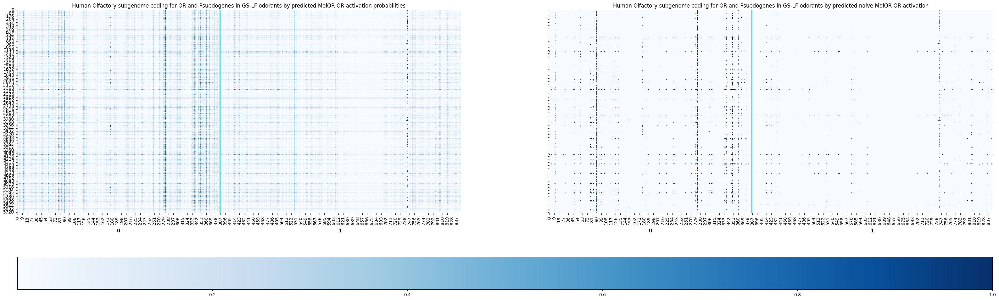

In [56]:
psuedo_idx = mol_OR.index
caption = "Human Olfactory subgenome coding for OR and Psuedogenes in GS-LF"
plot_OR_subgenome(dataset = mol_OR, index = psuedo_idx, filter_promiscous_mols = True, thresh = 0.3, OR_families = psuedo_counts, caption = caption)

### Statistics for psuedogene activation frequency versus OR gene activation frequency

Here, we plot a histogram of activation frequencies for psuedogenes, versus functional OR genes in HORDE

In [33]:
logits_path = "data/datasets/olfactory_subgenome_OR_logits.pt"
# Modify activation levels to show differences between pleasant and unpleasant smells
OR_logits = torch.load(logits_path).cpu()
#OR_logits = OR_logits[molecules_idx]
OR_preds = torch.sigmoid(OR_logits)
OR_activations = torch.round(OR_preds)

# we want to rearrange the indices based on 
OR_preds, OR_activations = OR_preds[:, psuedo_idx], OR_activations[:, psuedo_idx]

OR_gene_preds, psuedogene_preds = OR_preds[:, 0:psuedo_counts[0][1]], OR_preds[:, psuedo_counts[0][1]:psuedo_counts[0][1] + psuedo_counts[1][1]]

OR_gene_activations, psuedogene_activations = OR_activations[:, 0:psuedo_counts[0][1]], OR_activations[:, psuedo_counts[0][1]:psuedo_counts[0][1] + psuedo_counts[1][1]]

We can see form above that there is a clear shift in non-promiscous binding for protein-coding OR genes (left of the vertical blue line), and psuedogenes.

In [41]:
## Do a column-wise sum of the activations to get the total number of activated odorants for each OR (output should be tensor of number of columns)
OR_gene_activations_per_mol = OR_gene_activations.sum(dim=1)
psuedogene_activations_per_mol = psuedogene_activations.sum(dim=1)


In [42]:
OR_gene_activations_per_mol.median()

tensor(3.)

In [43]:
psuedogene_activations_per_mol.median()

tensor(1.)

In [47]:
## run rank-sum wilcoxon test to demonstrate that OR_gene_activations_per_mol is significantly different from psuedogene_activations_per_mol (and higher)
from scipy.stats import ranksums

stat, p = ranksums(OR_gene_activations_per_mol, psuedogene_activations_per_mol)
print('Statistics=%.8f, p=%.8f' % (stat, p))

Statistics=35.62072827, p=0.00000000


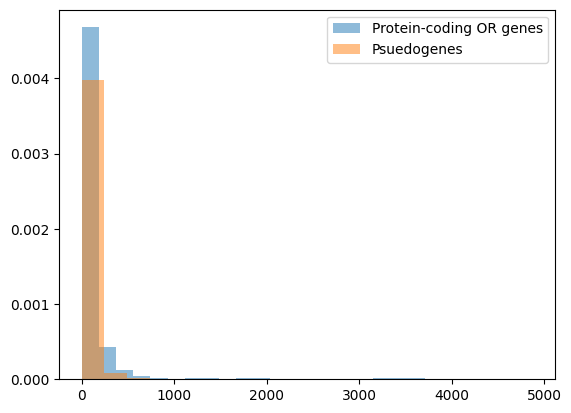

In [38]:
plt.hist(np.array(OR_gene_activations_per_OR), density=True, alpha=0.5, label='Protein-coding OR genes', bins=20) # plot number of activations for OR genes, by molecule
plt.hist(np.array(psuedogene_activations_per_OR), density=True, alpha=0.5, label='Psuedogenes', bins=20) # plot number of activations for psuedogenes, by molecule
plt.legend()
